In [9]:
from skimage.transform import radon, iradon, rescale
import matplotlib.pyplot as plt
import scipy.io 
import numpy as np
from sewar.full_ref import mse, rmse, psnr, uqi, ssim, ergas, scc, rase, sam, msssim, vifp
from PIL import Image  

iteration=30
plt.ion()

#image = scipy.io.loadmat('GroundTruthReconstruction.mat')
#trueImage=np.fliplr(np.rot90(image['FBP1200'],2))

#mat = scipy.io.loadmat('sinogram1200norm.mat') 
#sinogram=mat['s']
mat = scipy.io.loadmat('Data328Onlym.mat') 
sinogram=mat['m']
size=len(sinogram)

#azi_angle=np.arange(0,3600,3).astype('float')/10
azi_angle=np.arange(0,360,3)

np.set_printoptions(suppress=True,formatter={'float_kind':'{:16.8f}'.format}, linewidth=130)

In [2]:
def normalize16(I):
    mn= np.min(I)
    mx = np.max(I)
    mx -= mn

    I = ((I - mn)/(mx+0.0000001)) * 65535
    return I.astype(np.uint16)

In [3]:
#correct =iradon(sinogram,azi_angle,circle=True,filter_name=None)
#tr=np.fliplr(np.rot90(trueImage,2))
#fig,axs =plt.subplots(1,1,figsize =(20,10))
#axs.imshow(trueImage/4196,cmap='Greys_r');axs.set_title('Main');

#data = Image.fromarray(normalize16(trueImage))
#data.save("Iterative\GroundTruthReconstruction.png")

#print((trueImage.dtype))
#plt.show()

In [4]:
no_of_fun=12

def similarity (blur,org):
    val=[]
    val.append(mse(blur,org))
    val.append(rmse(blur, org))
    val.append(psnr(blur, org))
    val.append(ssim(blur, org)[0])
    val.append(ssim(blur,org)[1])
    val.append(uqi(blur, org))
    val.append(msssim(blur, org))
    val.append(ergas(blur, org))
    val.append(scc(blur, org))
    val.append(rase(blur, org))
    val.append(sam(blur, org))
    val.append(vifp(blur, org))
    return np.array(val,dtype='float64')

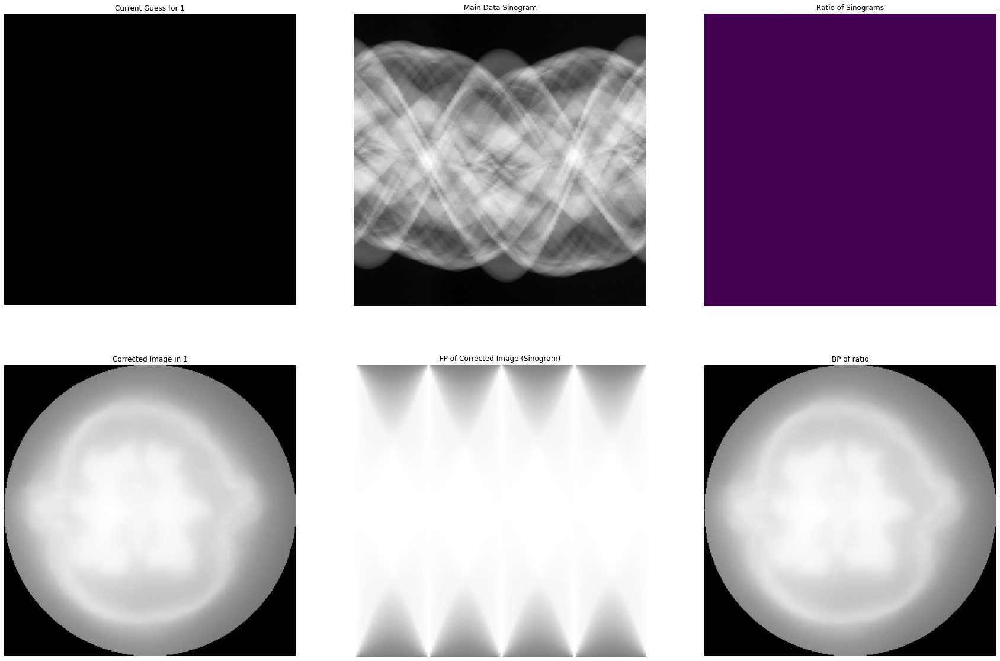

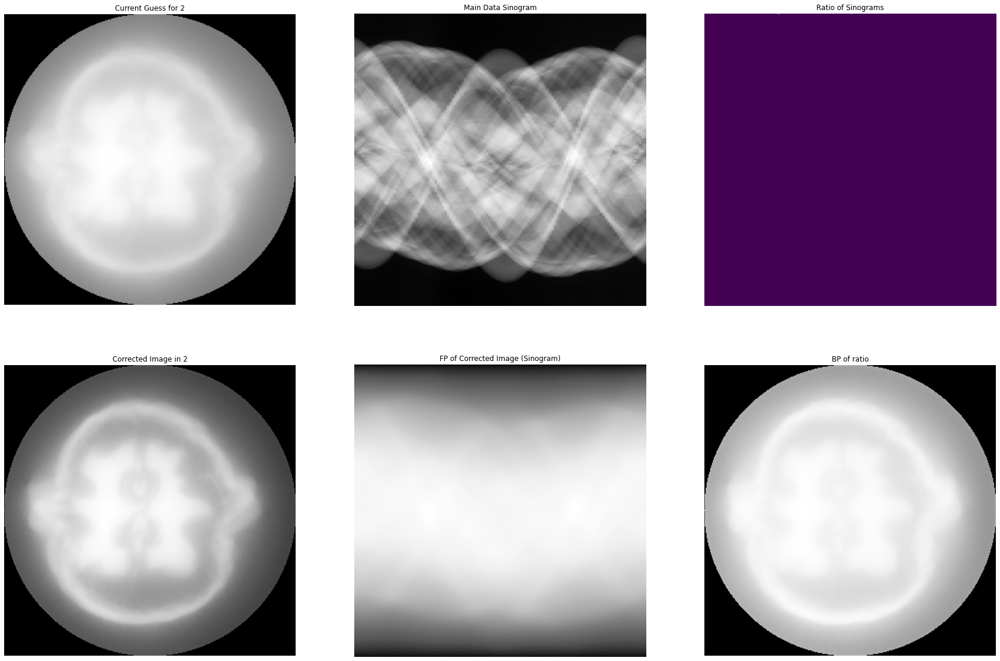

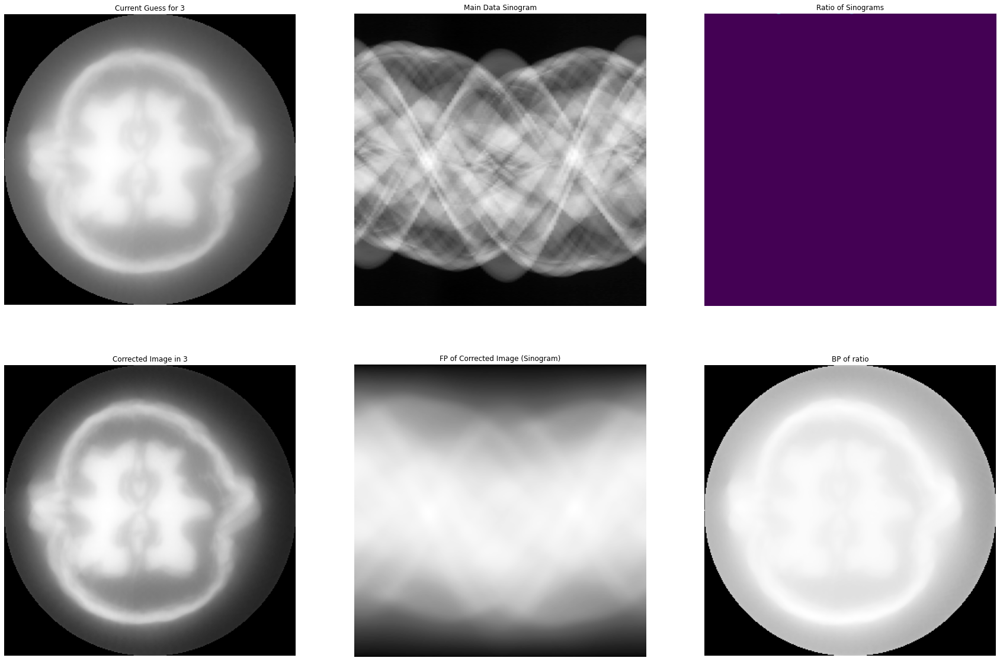

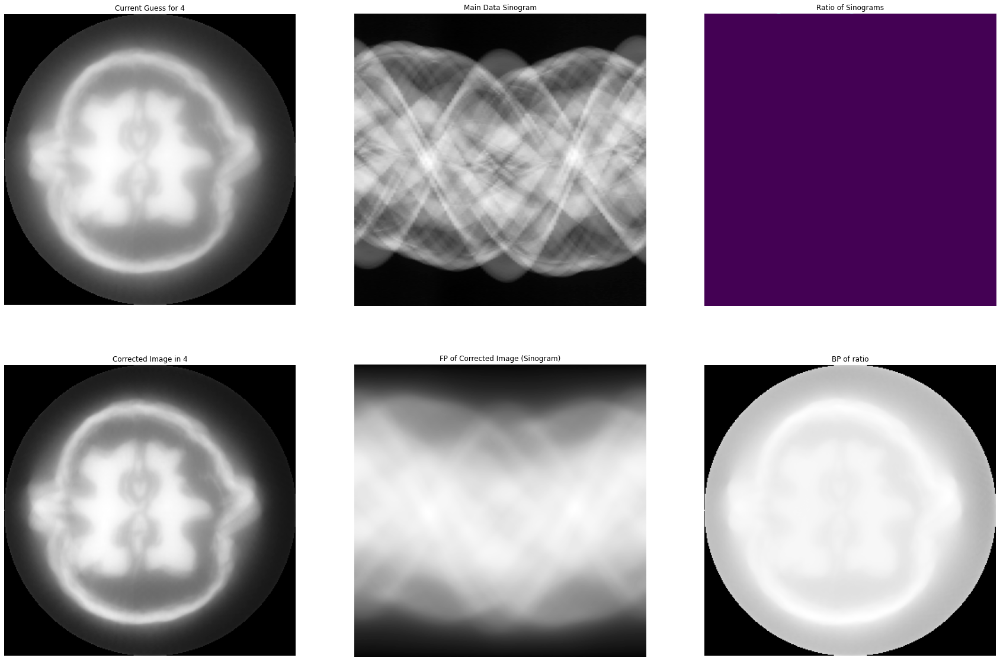

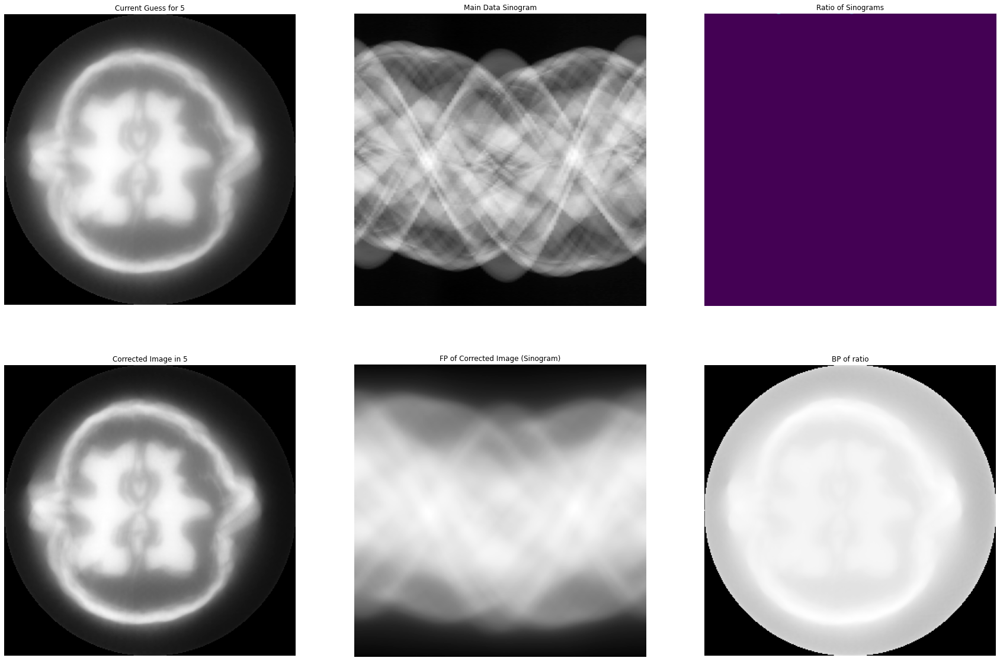

...

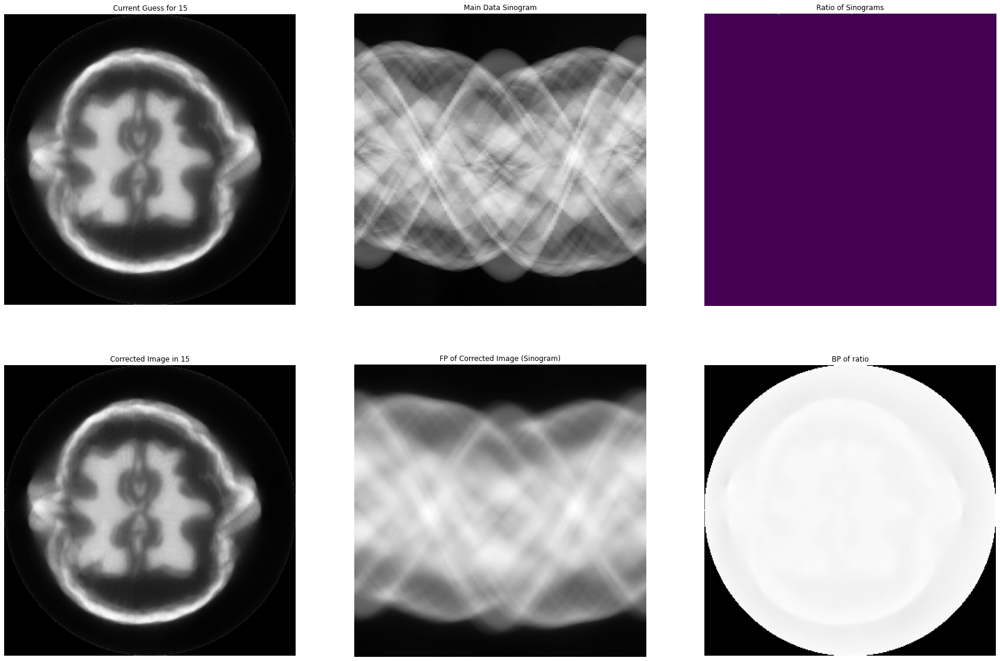

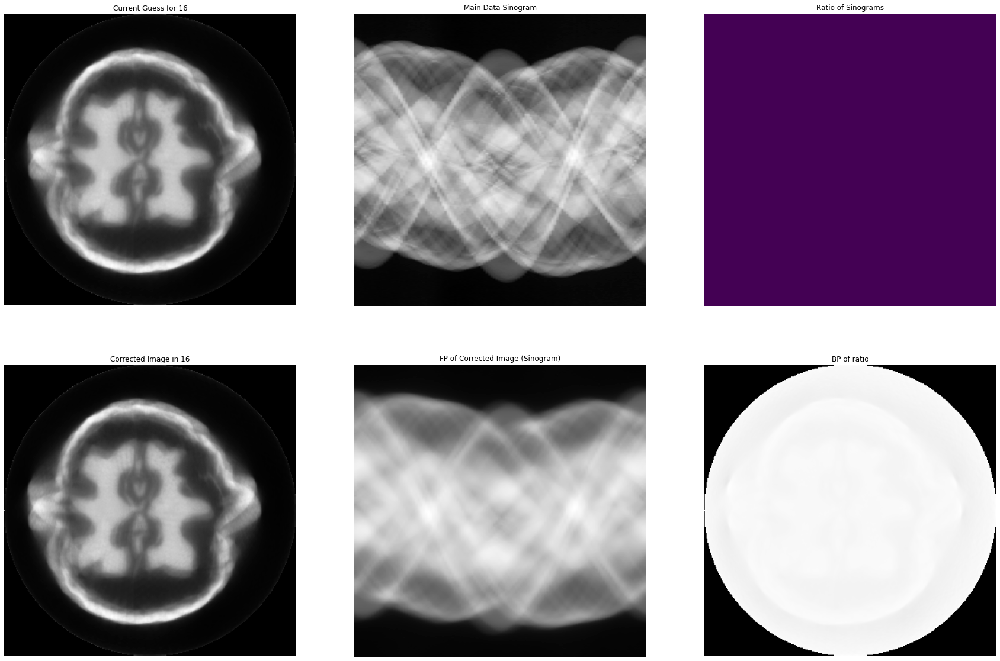

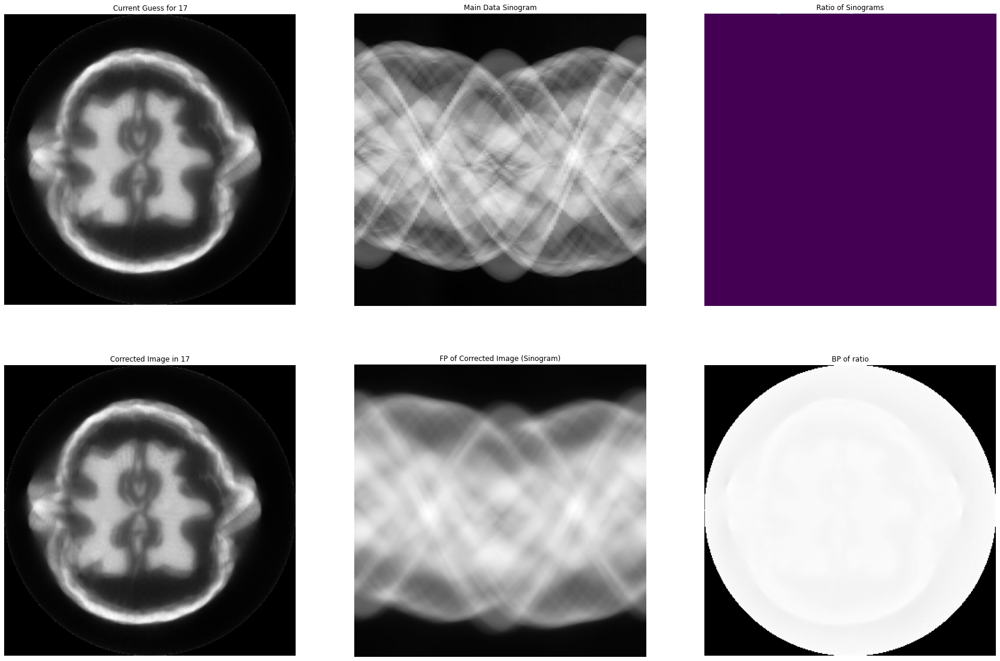

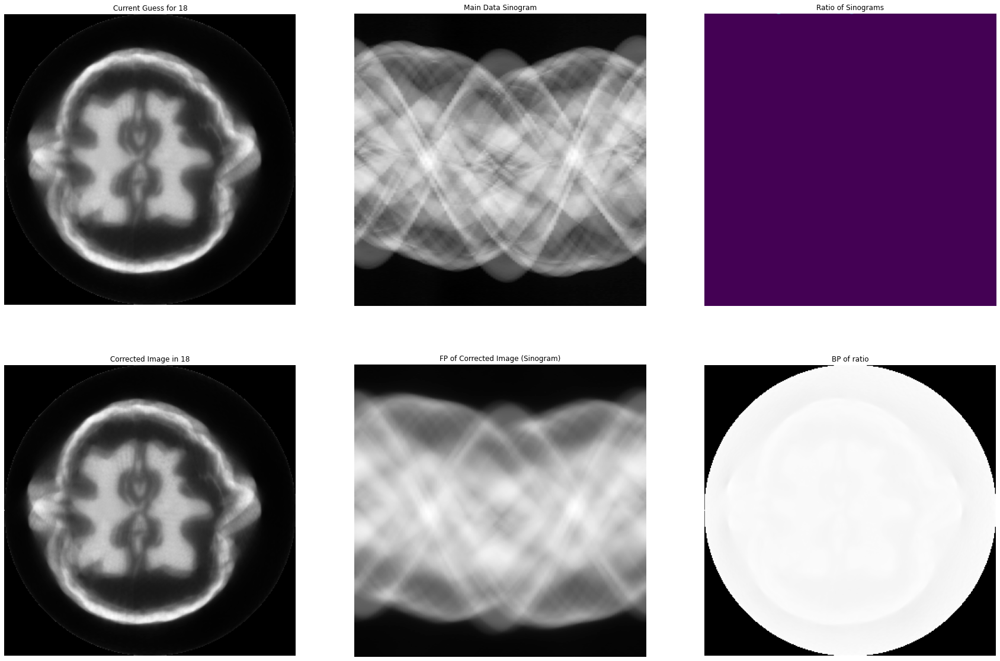

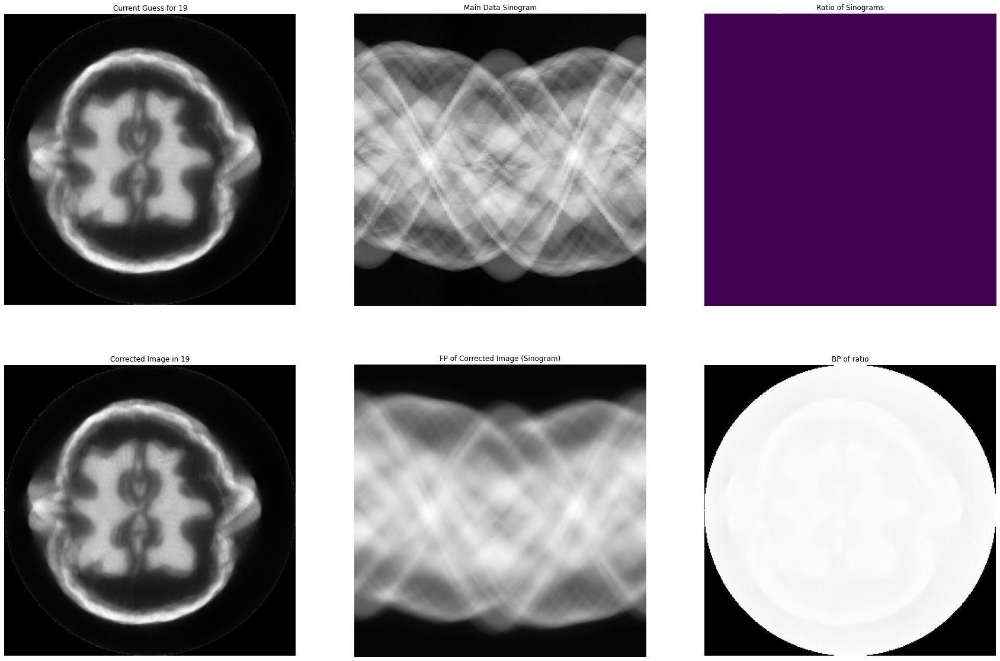

KeyboardInterrupt: 

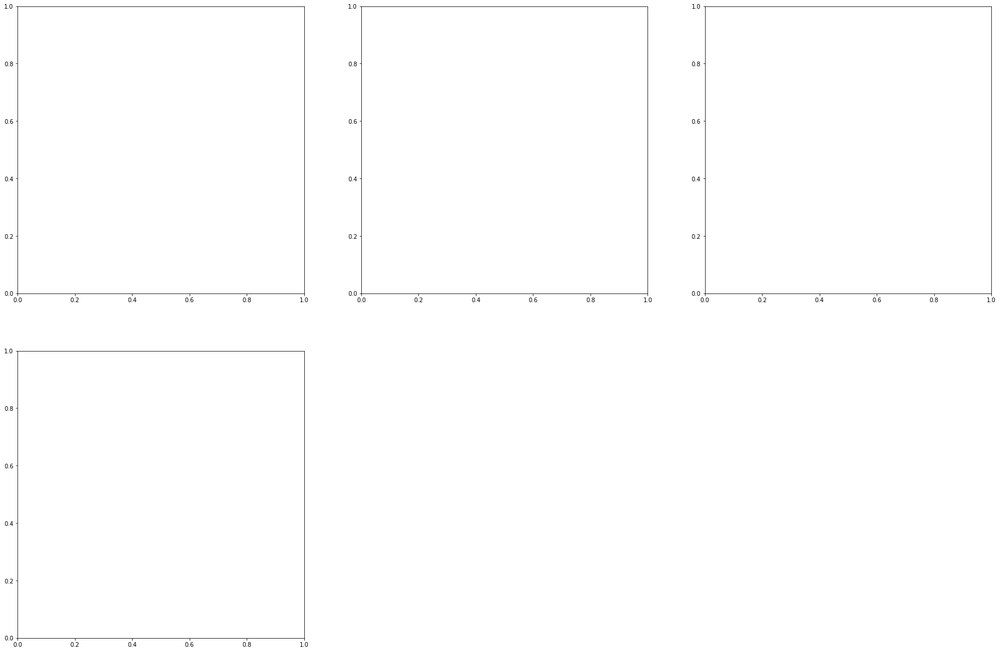

In [10]:
%%time
rec_image = np.ones((size,size))
sino_ones =np.ones(sinogram.shape)
sens_image=iradon(sino_ones,azi_angle,circle=True,filter_name=None)

#true_Image=normalize16(trueImage)
scipy.io.savemat("trueImageNormalized.mat", {"normalized": true_Image})

#stats = np.array(range(no_of_fun)).astype('float')

for ite in range(iteration):
    forwardp=radon(rec_image,azi_angle,circle=True)
   
    ratio=np.true_divide(sinogram,(forwardp+0.000001))# zero avoidance
    correct =iradon(ratio,azi_angle,circle=True,filter_name=None)
    correction =np.true_divide(correct,(sens_image+0.000001))
    
    fig,axs =plt.subplots(2,3,figsize =(30,20)) 
    
    axs[0,0].imshow(rec_image,cmap='Greys_r');axs[0,0].set_title('Current Guess for %d' % (ite+1));axs[0,0].axis([0 ,size, size, 0]);axs[0,0].axis('off')
    
    #stats=np.vstack((stats,similarity(normalize16(rec_image),true_Image)))
    
    rec_image=np.multiply(rec_image,correction)  
    
    
    #data = Image.fromarray(normalize16(rec_image))
    #st="Iterative\Image "+str(ite)+".png"
    #data.save(st)
    
    axs[0,1].imshow(sinogram,cmap='Greys_r');axs[0,1].set_title('Main Data Sinogram');axs[0,1].axis('auto');axs[0,1].axis('off')
    axs[0,2].imshow(ratio);axs[0,2].set_title('Ratio of Sinograms');axs[0,2].axis('auto');axs[0,2].axis('off')
    axs[1,1].imshow(forwardp,cmap='Greys_r');axs[1,1].set_title('FP of Corrected Image (Sinogram)');axs[1,1].axis('auto');axs[1,1].axis('off')
    axs[1,2].imshow(correct,cmap='Greys_r');axs[1,2].set_title('BP of ratio');axs[1,2].axis([0 ,size, size, 0]);axs[1,2].axis('off')
    axs[1,0].imshow(rec_image,cmap='Greys_r');axs[1,0].set_title('Corrected Image in %d' % (ite+1));axs[1,0].axis([0,size,size,0]);axs[1,0].axis('off')
    plt.show()
#scipy.io.savemat("rec_image.mat", {"normalized_corrected_image": normalize16(rec_image)})


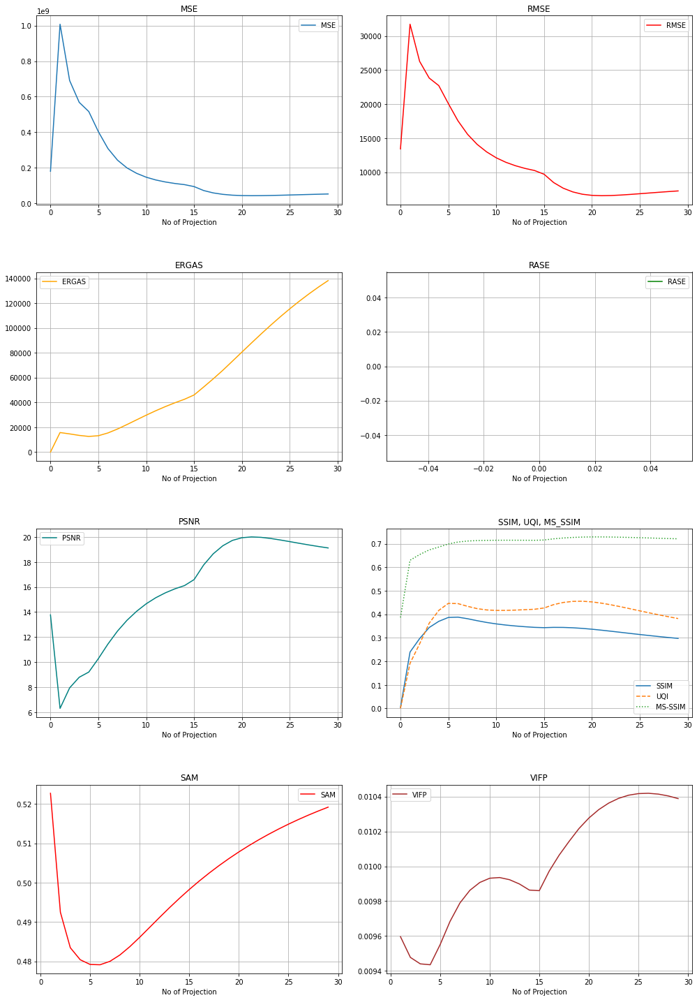

In [6]:
val=np.delete(stats,0,0)
scipy.io.savemat("val.mat", {"values": val})


piter=iteration

fig, axs = plt.subplots(4,2,figsize=(14, 20))  
axs[0,0].plot(range(piter), val[:,0],label='MSE');
axs[0,0].set_xlabel('No of Projection')
axs[0,0].set_title("MSE")
axs[0,0].legend();
axs[0,0].grid(True);


axs[0,1].plot(range(piter), val[:,1],label='RMSE',color='red');
axs[0,1].set_xlabel('No of Projection')
axs[0,1].set_title("RMSE")
axs[0,1].legend();
axs[0,1].grid(True);

 
axs[1,0].plot(range(piter), val[:,7],label='ERGAS',color='orange');
axs[1,0].set_xlabel('No of Projection')
axs[1,0].set_title("ERGAS")
axs[1,0].legend();
axs[1,0].grid(True);


axs[1,1].plot(range(piter), val[:,9],label='RASE',color='green');
axs[1,1].set_xlabel('No of Projection')
axs[1,1].set_title("RASE")
axs[1,1].legend();
axs[1,1].grid(True);

axs[2,0].plot(range(piter), val[:,2],label='PSNR',color='teal');
axs[2,0].set_xlabel('No of Projection')
axs[2,0].set_title("PSNR")
axs[2,0].legend();
axs[2,0].grid(True);


axs[2,1].plot(range(piter), val[:,3],label='SSIM');
axs[2,1].plot(range(piter), val[:,5],label='UQI',linestyle='--');
axs[2,1].plot(range(piter), val[:,6],label='MS-SSIM',linestyle=':');
axs[2,1].set_xlabel('No of Projection')
axs[2,1].set_title("SSIM, UQI, MS_SSIM")
axs[2,1].legend();
axs[2,1].grid(True);

axs[3,0].plot(range(piter), val[:,10],label='SAM',color='red');
axs[3,0].set_xlabel('No of Projection')
axs[3,0].set_title("SAM")
axs[3,0].legend();
axs[3,0].grid(True);

axs[3,1].plot(range(piter), val[:,11],label='VIFP',color='brown');
axs[3,1].set_xlabel('No of Projection')
axs[3,1].set_title("VIFP")
axs[3,1].legend();
axs[3,1].grid(True);

plt.tight_layout(w_pad=2, h_pad=5.0)

plt.savefig('ITER328.png',facecolor='white')


In [ ]:
scipy.io.savemat("rec_image.mat", {"normalized_corrected_image": normalize16(rec_image)})